# Manipulação de imagem utilizando OpenCV



### Fontes

* https://www.pyimagesearch.com/2014/08/25/4-point-opencv-getperspective-transform-example/
* https://www.pyimagesearch.com/2014/09/01/build-kick-ass-mobile-document-scanner-just-5-minutes/

### OpenCV documentation

* https://docs.opencv.org/master/d2/d96/tutorial_py_table_of_contents_imgproc.html

### Author
* Victor Bona - https://www.linkedin.com/in/victorbona/

In [1]:
# Run this before execute the rest of the cells. 
!pip install opencv-contrib-python-nonfree

     |████████████████████████████████| 34.9MB 120kB/s 


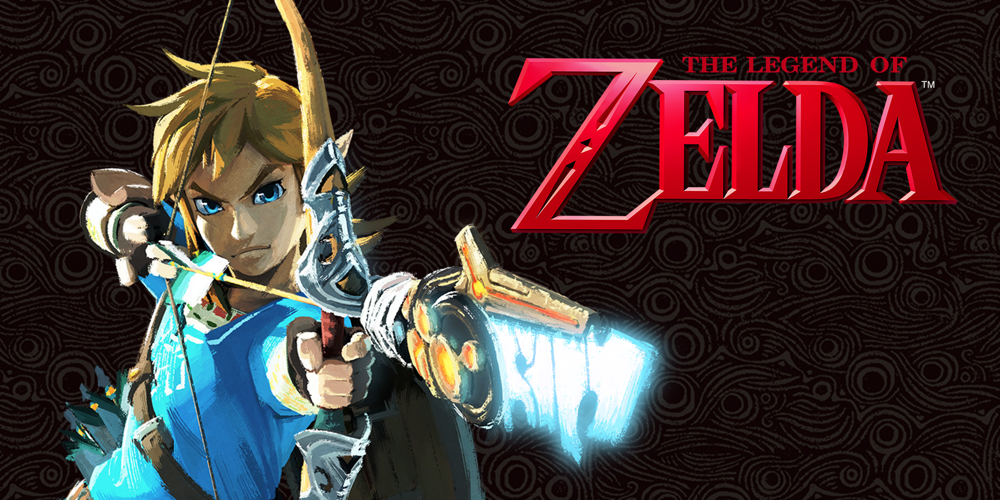

In [6]:
import os
import io
import cv2
import imutils
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from skimage.filters import threshold_local

def open_img(path):
  img = cv2.imread(path)
  return img

def img_show(img):
  cv2_imshow(img)

img = open_img('Link.jpg')
img_show(img)

## Transformação geométrica da imagem

* Documentação do openCV: https://docs.opencv.org/2.4/modules/imgproc/doc/geometric_transformations.html?highlight=resize

### Redimensionamento

O redimensionamento é utilizado para alterar o tamanho da imagem, contudo, como estamos manipulando suas médidas, corremos o risco de perder o aspect ratio original da imagem.

Manter o aspect ratio da imagem depende de um calculo utilizando as medidas originais da imagem e aplicar um método de interpolação.

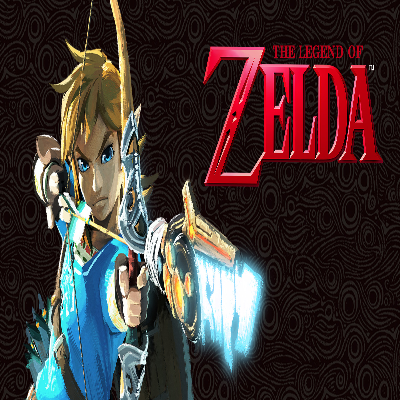

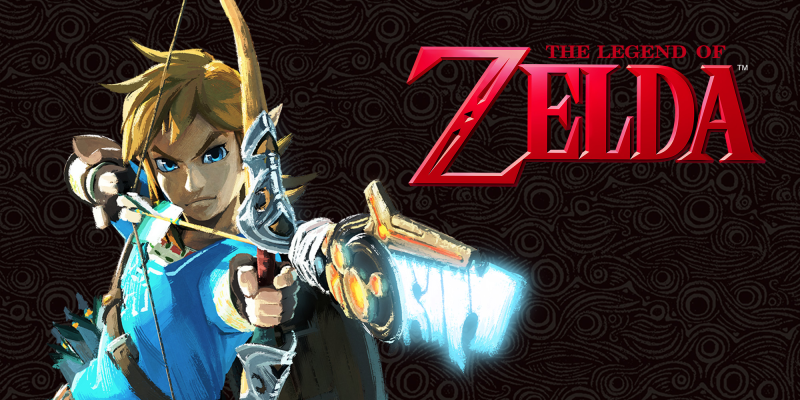

In [7]:
# Não manteem o aspect-ratio
img_resize = cv2.resize(img, (400, 400))
img_show(img_resize)

# Manteem o aspect-ratio
def image_resize(image, width = None, height = None, inter = cv2.INTER_AREA):
    dim = None
    (h, w) = image.shape[:2]
    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))

    resized = cv2.resize(image, dim, interpolation = inter)
    return resized

img_resize = image_resize(img, height = 400)
img_show(img_resize)

### Deskew (Rotação)

In [8]:
deskew_img = cv2.bitwise_not(img_resize)
tresh_img = thresh = cv2.threshold(deskew_img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

coords = np.column_stack(np.where(tresh_img > 0))
angle = cv2.minAreaRect(coords)[-1]
if angle < -45:
	angle = -(90 + angle)
else:
	angle = -angle

(h, w) = img_resize.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated = cv2.warpAffine(img_resize, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

img_show(rotated)

error: ignored

## Remoção de ruído

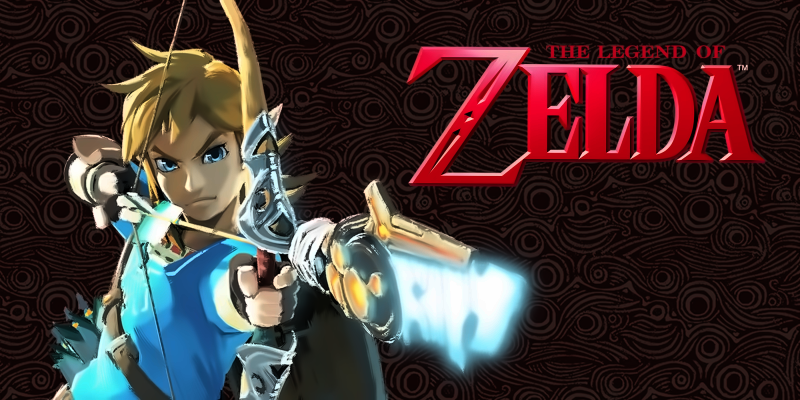

In [9]:
d_noise_img = cv2.fastNlMeansDenoisingColored(img_resize, None, 10, 10, 7, 15)
img_show(d_noise_img)

## Greyscale

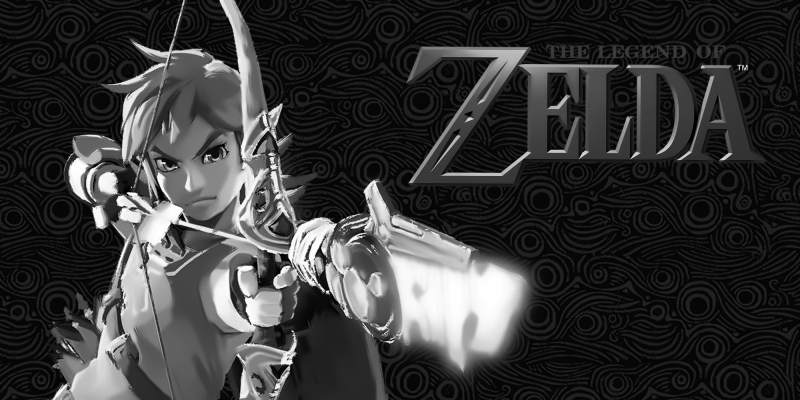

In [10]:
greyscale_img = cv2.cvtColor(d_noise_img, cv2.COLOR_BGR2GRAY)
img_show(greyscale_img)

## Aumento de contraste

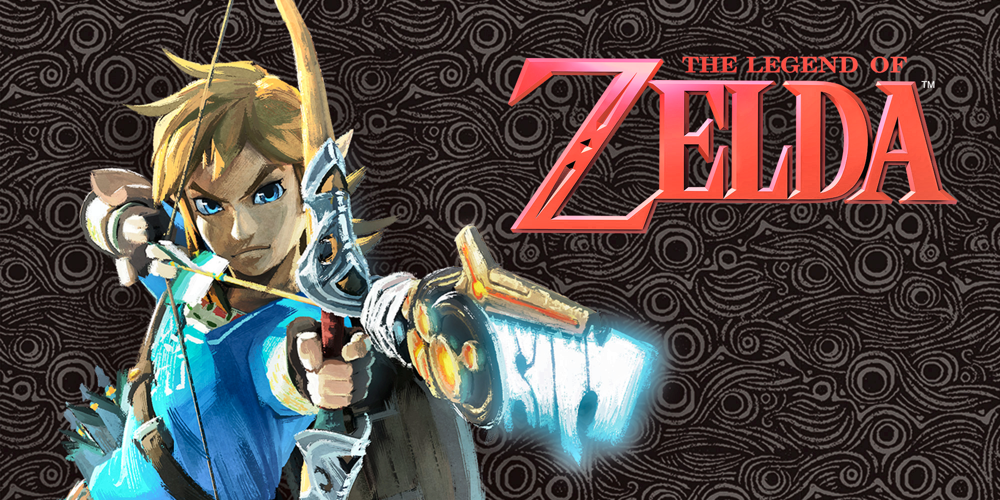

In [13]:
def contrast_increase(img):
  lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
  l, a, b = cv2.split(lab)
  clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
  cl = clahe.apply(l)
  limg = cv2.merge((cl,a,b))
  final_sample = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
  return final_sample

high_constrast_img_sample = contrast_increase(img)
img_show(high_constrast_img_sample)